# Implementation Linear Bayesian Denoising Autoencoder on X-ray chest images dataset


## Data loading and processing

In [16]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms.functional as TF
from torchvision import datasets
import torchvision.transforms as transforms
from torch.utils.data import random_split, DataLoader
from torch.utils.tensorboard import SummaryWriter
from tqdm import tqdm
!pip install -q tensorflow
%load_ext tensorboard

import os
import cv2
from sklearn.model_selection import train_test_split
from PIL import Image


import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [17]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [18]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [49]:
import os
import cv2
from sklearn.model_selection import train_test_split
from torchvision import transforms
from torch.utils.data import DataLoader
import torch
import matplotlib.pyplot as plt

image_size = 64

# Paths to the folders containing JPEG images
normal_train_path = '/content/drive/MyDrive/xray_chest/normal_train'
pneumonia_train_path = '/content/drive/MyDrive/xray_chest/pneumonia_train'
normal_test_path = '/content/drive/MyDrive/xray_chest/normal_test'
pneumonia_test_path = '/content/drive/MyDrive/xray_chest/pneumonia_test'

# List all files in the folders
normal_train_files = [os.path.join(normal_train_path, f) for f in os.listdir(normal_train_path) if f.endswith('.jpg') or f.endswith('.jpeg')]
pneumonia_train_files = [os.path.join(pneumonia_train_path, f) for f in os.listdir(pneumonia_train_path) if f.endswith('.jpg') or f.endswith('.jpeg')]
normal_test_files = [os.path.join(normal_test_path, f) for f in os.listdir(normal_test_path) if f.endswith('.jpg') or f.endswith('.jpeg')]
pneumonia_test_files = [os.path.join(pneumonia_test_path, f) for f in os.listdir(pneumonia_test_path) if f.endswith('.jpg') or f.endswith('.jpeg')]

# Combine training files for splitting into training and validation
trainval_files = normal_train_files + pneumonia_train_files

# Split the training files into training and validation sets
train_files, val_files = train_test_split(trainval_files, test_size=624, random_state=42)

# Define image transformations
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((image_size, image_size)),
    transforms.Grayscale(num_output_channels=1),  # Convert to grayscale
    transforms.ToTensor(),
])

# Create custom datasets
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, files, transform=None):
        self.files = files
        self.transform = transform

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        img_path = self.files[idx]
        image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # Read image in grayscale using OpenCV
        if self.transform:
            image = self.transform(image)
        label = 0 if 'normal' in img_path else 1
        return image, label

train_dataset = CustomDataset(train_files, transform=transform)
val_dataset = CustomDataset(val_files, transform=transform)
test_dataset = CustomDataset(normal_test_files + pneumonia_test_files, transform=transform)

# Checking dataset sizes
print(f'Training dataset size: {len(train_dataset)}')
print(f'Validation dataset size: {len(val_dataset)}')
print(f'Test dataset size: {len(test_dataset)}')


Training dataset size: 4608
Validation dataset size: 624
Test dataset size: 624


(64, 64)


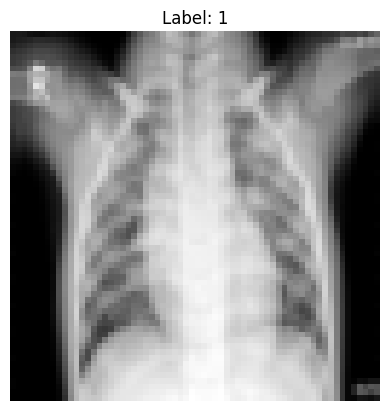

In [50]:
# Example: creating DataLoaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Get the first image and its corresponding label from train_dataset
first_image, label = train_dataset[0]

# Convert the tensor back to a PIL Image
first_image_pil = transforms.ToPILImage()(first_image)
print(first_image_pil.size)

# Plot the image
plt.imshow(first_image_pil, cmap='gray')  # cmap='gray' ensures that the image is shown in grayscale
plt.title('Label: {}'.format(label))
plt.axis('off')  # Turn off axis
plt.show()

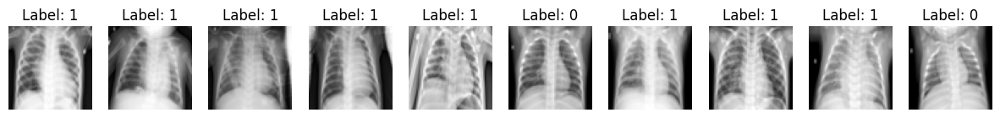

In [51]:
# Get a batch of training data
data_iter = iter(train_loader)
images, labels = next(data_iter)

# Plot the first 10 images
fig, axes = plt.subplots(1, 10, figsize=(15, 1.5))
for i in range(10):
    ax = axes[i]
    ax.imshow(images[i].numpy().squeeze(), cmap='gray')
    ax.axis('off')
    ax.set_title('Label: {}'.format(labels[i].item()))

plt.show()

## Autoencoder Architectures

In [53]:
def MC_dropout(act_vec, p=0.5, mask=True):
  return F.dropout(act_vec, p=p, training=mask, inplace=False)

class SimpleLinearBDAE(nn.Module):
  def __init__(self):
    super().__init__()
    self.encoder_fc = nn.Linear(image_size*image_size, 512)
    self.encoder_act = nn.ReLU()
    self.decoder_fc = nn.Linear(512, image_size*image_size)
    self.decoder_act = nn.Sigmoid()

  def forward(self, x, mask=True):
    # Encoder
    y = self.encoder_fc(x)
    y = self.encoder_act(y)

    # Decoder
    z = self.decoder_fc(y)
    z = MC_dropout(z, p=0.2, mask=mask)
    z = self.decoder_act(z)

    return z

  def sample_predict(self, x, Nsamples):
    predictions = x.data.new(Nsamples, x.shape[0], image_size*image_size)
    for i in range(Nsamples):
      y = self.forward(x)
      predictions[i] = y

    predictions_mean = torch.mean(predictions, dim=0)
    predictions_var = torch.var(predictions, dim=0)

    return predictions, predictions_mean, predictions_var

In [9]:
class LinearBDAE(nn.Module):
    def __init__(self):
        super().__init__()
        # Encoder layers
        self.enc_fc1 = nn.Linear(28*28, 512)
        self.enc_fc2 = nn.Linear(512, 256)
        self.enc_fc3 = nn.Linear(256, 128)

        # Decoder layers
        self.dec_fc1 = nn.Linear(128, 256)
        self.dec_fc2 = nn.Linear(256, 512)
        self.dec_fc3 = nn.Linear(512, 28*28)

    def forward(self, x, dropout_p=0.3, apply_dropout=True):
        # Encoder forward pass
        x = F.relu(self.enc_fc1(x))
        x = F.relu(self.enc_fc2(x))
        x = F.relu(self.enc_fc3(x))

        # Decoder forward pass with MC Dropout
        x = F.relu(self.dec_fc1(x))
        x = MC_dropout(x, p=dropout_p, mask=apply_dropout)
        x = F.relu(self.dec_fc2(x))
        x = MC_dropout(x, p=dropout_p, mask=apply_dropout)
        x = torch.sigmoid(self.dec_fc3(x))
        return x

    def sample_predict(self, x, Nsamples):
      predictions = x.data.new(Nsamples, x.shape[0], 256*256)
      for i in range(Nsamples):
        y = self.forward(x)
        predictions[i] = y

      predictions_mean = torch.mean(predictions, dim=0)
      predictions_var = torch.var(predictions, dim=0)

      return predictions, predictions_mean, predictions_var

## Noise schemes

In [54]:
def add_gaussian_noise(images, noise_factor=0.5):
  corrupted_images = images + noise_factor * torch.randn(*images.shape)
  corrupted_images = np.clip(corrupted_images, 0., 1.)
  return corrupted_images

def add_masking_noise(images, masking_rate=0.5):
    # Generate a random mask with the same shape as the images
    mask = torch.rand_like(images) > masking_rate
    # Apply the mask to the images
    noisy_images = images * mask
    return noisy_images

def add_salt_pepper_noise(images, pepper_prob=0.1, salt_prob=None):
    noisy_img = images.clone()
    if salt_prob is None:
        salt_prob = 1 - pepper_prob
    # Generating random noise mask
    noise_mask = torch.rand_like(images)
    # Adding pepper noise
    noisy_img[noise_mask < pepper_prob] = 0
    # Adding salt noise
    noisy_img[noise_mask > salt_prob] = 1
    return noisy_img

def add_gaussian_blur(images, kernel_size=5, sigma=2):

    blurred_images = []
    for image in images:
        # Convert tensor to PIL image
        image_pil = TF.to_pil_image(image.view(-1, 28, 28))

        # Apply Gaussian blur
        blurred_image_pil = TF.gaussian_blur(image_pil, kernel_size, sigma)

        # Convert blurred image back to tensor
        blurred_image_tensor = TF.to_tensor(blurred_image_pil)

        blurred_images.append(blurred_image_tensor)

    return torch.stack(blurred_images).view(-1, 28*28)


add_noise = lambda images: add_gaussian_noise(images, noise_factor=0.2)

## Training Process

### Training functions

In [33]:
def train(train_loader, net, optimizer, criterion):
  total_loss = 0

  for i, data in enumerate(train_loader):

        images, _ = data
        images = images.view(images.size(0), -1)

        # ADD NOISE PROCESS
        corrupted_images = add_noise(images)

        images = images.to(device)
        corrupted_images = corrupted_images.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net.forward(corrupted_images)

        loss = criterion(outputs, images)

        loss.backward()
        optimizer.step()

        # keep track of loss and accuracy
        total_loss += loss.item() * images.size(0)

  avg_loss = total_loss/len(train_loader.dataset)  # Compute average loss

  return avg_loss

In [34]:
def validation(val_loader, net, criterion, Nsamples):
  total_loss = 0

  # Use torch.no_grad to skip gradient calculation, not needed for evaluation
  with torch.no_grad():
      # iterate through batches
        for data in val_loader:
            # get the inputs; data is a list of [inputs, labels]
            images, _ = data
            # images = images.to(device)
            images = images.view(images.size(0), -1)

            corrupted_images = add_noise(images)

            images = images.to(device)
            corrupted_images = corrupted_images.to(device)

            # forward pass
            predictions, predictions_mean, predictions_var = net.sample_predict(corrupted_images, Nsamples)
            loss = criterion(predictions_mean, images)

            # keep track of loss and accuracy
            total_loss += loss.item() * images.size(0)

  return total_loss/len(val_loader.dataset)

### Training Procedure

In [ ]:
# To completely clean your tensorboard uncomment and run the following command.
!rm -r runs
#Set random seed
torch.manual_seed(42)

train_losses = []
val_losses = []

# Create a writer to write to Tensorboard
writer = SummaryWriter()

model = SimpleLinearBDAE().to(device)
criterion = nn.MSELoss()
learning_rate = 1e-3
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

num_epochs = 1

Nsamples = 10

for epoch in tqdm(range(num_epochs)):  # loop over the dataset multiple times
    # Train on data
    train_loss = train(train_loader, model, optimizer, criterion)

    # Test on data
    val_loss = validation(val_loader, model, criterion, Nsamples)

    # Log metrics to Tensorboard
    writer.add_scalars("Loss", {'Train': train_loss, 'Validation':val_loss}, epoch)

    train_losses.append(train_losses)
    train_losses.append(val_losses)

print('Finished Training')

#Close the writer
writer.flush()
writer.close()

  0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
%tensorboard --logdir runs/

<IPython.core.display.Javascript object>

## Visualizations

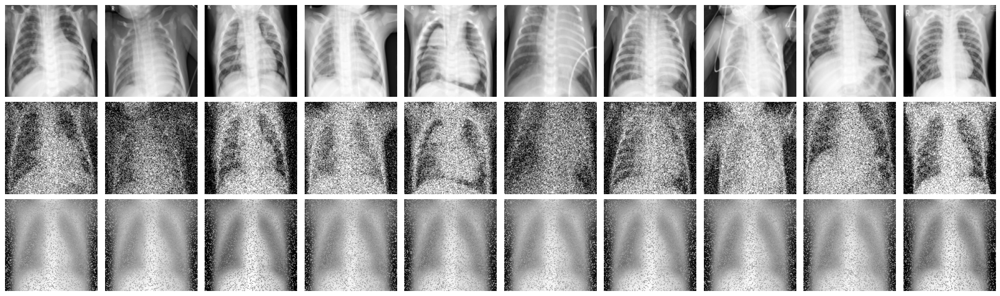

In [37]:
def display_images(train_loader, net):
    # Get the first batch of images
    images, _ = next(iter(train_loader))
    images_flattened = images.view(images.size(0), -1)

    # Add noise to images
    corrupted_images = add_noise(images)
    corrupted_images_flattened = corrupted_images.view(corrupted_images.size(0), -1)

    corrupted_images_flattened = corrupted_images_flattened.to(device)

    # Pass corrupted images through the network to get denoised images
    net.eval()
    with torch.no_grad():
        denoised_images = net(corrupted_images_flattened)

    # Convert images to numpy for visualization
    images_np = images.numpy()
    corrupted_images_np = corrupted_images.view(denoised_images.size(0), 1, 128, 128).numpy()
    denoised_images_np = denoised_images.view(denoised_images.size(0), 1, 128, 128).cpu().numpy()

    # Display images
    fig, axes = plt.subplots(nrows=3, ncols=10, figsize=(20, 6))
    for i in range(10):
        # Original images
        ax = axes[0, i]
        ax.imshow(images_np[i].transpose(1, 2, 0), cmap='gray')
        ax.axis('off')

        # Corrupted images
        ax = axes[1, i]
        ax.imshow(corrupted_images_np[i].transpose(1, 2, 0), cmap='gray')
        ax.axis('off')

        # Denoised images
        ax = axes[2, i]
        ax.imshow(denoised_images_np[i].transpose(1, 2, 0), cmap='gray')
        ax.axis('off')

    axes[0, 0].set_ylabel('Original', size='large')
    axes[1, 0].set_ylabel('Corrupted', size='large')
    axes[2, 0].set_ylabel('Denoised', size='large')

    plt.tight_layout()
    plt.show()

display_images(train_loader, model)

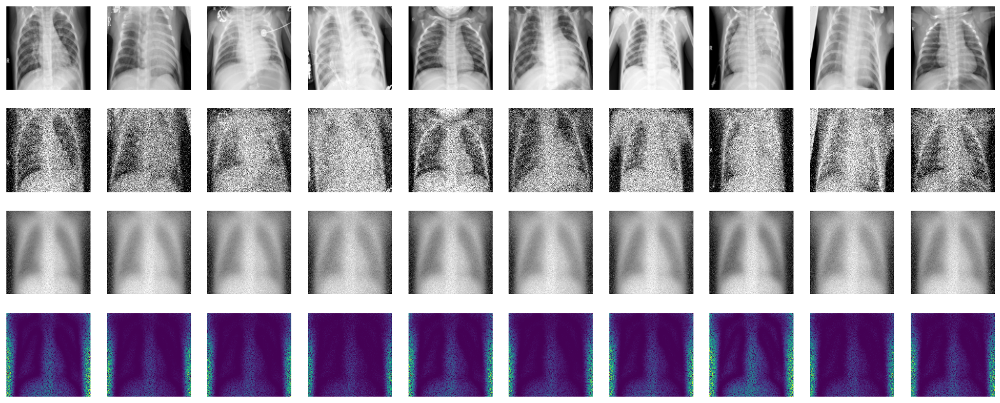

In [40]:
def plot_mean_variance(train_loader):

  images, _ = next(iter(train_loader))
  images_flattened = images.view(images.size(0), -1)
  # Add noise to images
  corrupted_images = add_noise(images)
  corrupted_images_flattened = corrupted_images.view(corrupted_images.size(0), -1)

  corrupted_images_flattened = corrupted_images_flattened.to(device)

  model.eval()
  with torch.no_grad():
      _, predictions_mean, predictions_var = model.sample_predict(corrupted_images_flattened, 10)


  # Assuming predictions_mean and predictions_var are tensors
  first_ten_mean = predictions_mean[:10]  # Extracting the first ten samples from predictions_mean
  first_ten_var = predictions_var[:10]    # Extracting the first ten samples from predictions_var

  # Reshaping the samples back into images
  first_ten_mean_images = first_ten_mean.view(-1, 128, 128)  # Assuming images are 28x28
  first_ten_var_images = first_ten_var.view(-1, 128, 128)    # Assuming images are 28x28

  # Assuming images are 28x28
  image_size = 128

  # Extracting the first ten samples from the batch
  clean_images = images[:10]
  corrupted_images_subset = corrupted_images[:10]
  mean_images = first_ten_mean_images.cpu()
  var_images = first_ten_var_images.cpu()

  # Plotting the images
  fig, axs = plt.subplots(4, 10, figsize=(20, 8))

  for i in range(10):
      # Plot clean images
      im_clean = axs[0, i].imshow(clean_images[i].view(image_size, image_size), cmap='gray')
      axs[0, i].axis('off')

      # Plot corrupted images
      im_corrupted = axs[1, i].imshow(corrupted_images_subset[i].view(image_size, image_size), cmap='gray')
      axs[1, i].axis('off')

      # Plot denoised (mean) images
      im_mean = axs[2, i].imshow(mean_images[i], cmap='gray')
      axs[2, i].axis('off')

      # Plot uncertainty (variance) images
      im_var = axs[3, i].imshow(var_images[i], cmap='viridis')
      axs[3, i].axis('off')


  # Add colorbars for the uncertainty (variance) images
  # fig.colorbar(im_var, ax=axs[3, :], shrink=0.6)

  plt.show()

plot_mean_variance(train_loader)